In [ ]:
pip install scikeras

In [1]:
# Load the necessary libraries
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import cv2
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import save_model, load_model
from tensorflow.keras.preprocessing import image as keras_image
from scikeras.wrappers import KerasClassifier

In [9]:
data_dir = 'plantvillage dataset\color'

class_folders = os.listdir(data_dir)
image_paths = []
labels = []

for class_folder in class_folders:
    class_path = os.path.join(data_dir, class_folder)
    image_files = os.listdir(class_path)
    for image_file in image_files:
        image_path = os.path.join(class_path, image_file)
        image_paths.append(image_path)
        labels.append(class_folder)

df = pd.DataFrame({'image_path': image_paths, 'label': labels})

In [3]:
df.head()

,image_path,label
0,plantvillage dataset\color\Apple___Apple_scab\...,Apple___Apple_scab
1,plantvillage dataset\color\Apple___Apple_scab\...,Apple___Apple_scab
2,plantvillage dataset\color\Apple___Apple_scab\...,Apple___Apple_scab
3,plantvillage dataset\color\Apple___Apple_scab\...,Apple___Apple_scab
4,plantvillage dataset\color\Apple___Apple_scab\...,Apple___Apple_scab


In [4]:
df.shape

(54305, 2)

In [5]:
print("The classes:\n", np.unique(df['label']))

The classes:
 ['Apple___Apple_scab' 'Apple___Black_rot' 'Apple___Cedar_apple_rust'
 'Apple___healthy' 'Blueberry___healthy'
 'Cherry_(including_sour)___Powdery_mildew'
 'Cherry_(including_sour)___healthy' 'Cocoa_swollen_shoot'
 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot'
 'Corn_(maize)___Common_rust_' 'Corn_(maize)___Northern_Leaf_Blight'
 'Corn_(maize)___healthy' 'Grape___Black_rot'
 'Grape___Esca_(Black_Measles)'
 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)' 'Grape___healthy'
 'Orange___Haunglongbing_(Citrus_greening)' 'Peach___healthy'
 'Pepper,_bell___Bacterial_spot' 'Pepper,_bell___healthy'
 'Potato___Early_blight' 'Potato___Late_blight' 'Potato___healthy'
 'Raspberry___healthy' 'Soybean___healthy' 'Squash___Powdery_mildew'
 'Strawberry___Leaf_scorch' 'Strawberry___healthy'
 'Tomato___Bacterial_spot' 'Tomato___Early_blight' 'Tomato___Late_blight'
 'Tomato___Leaf_Mold' 'Tomato___Septoria_leaf_spot'
 'Tomato___Spider_mites Two-spotted_spider_mite' 'Tomato___Target_Spot'
 'T

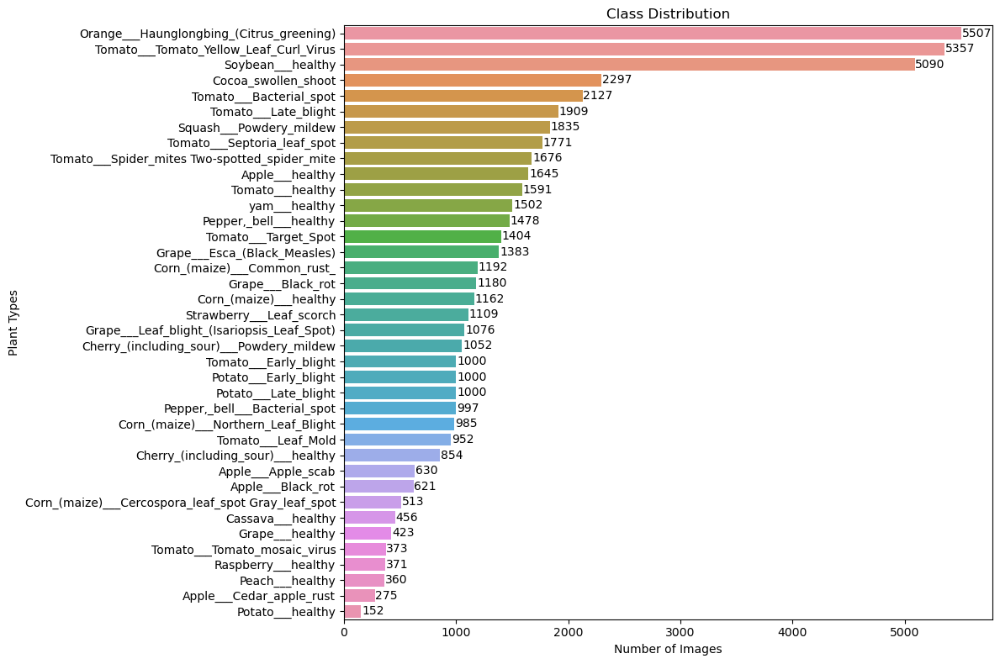

In [10]:
# Count the number of images in each class
class_counts = df['label'].value_counts()

# Visualize class distribution using a horizontal bar plot
plt.figure(figsize=(12, 8))
ax = sns.barplot(x=class_counts.values, y=class_counts.index, orient='h')
plt.title('Class Distribution')
plt.xlabel('Number of Images')
plt.ylabel('Plant Types')
plt.tight_layout()  # Adjust the layout to prevent overlapping labels

# Add data labels to each bar
for i, v in enumerate(class_counts.values):
    ax.text(v + 5, i, str(v), color='black', va='center')

plt.show()

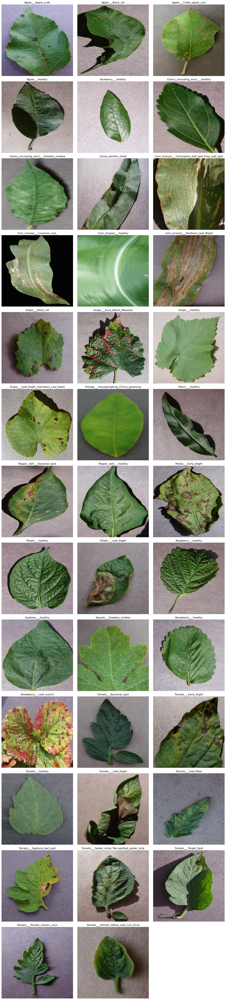

In [7]:
# Display sample images from each class
num_classes = len(df['label'].unique())
num_images_per_row = 3
num_rows = (num_classes + num_images_per_row - 1) // num_images_per_row

plt.figure(figsize=(15, 5 * num_rows))  # Adjust figure size based on the number of rows

for i, plant_class in enumerate(df['label'].unique()):
    plt.subplot(num_rows, num_images_per_row, i + 1)
    
    # Inside the loop for displaying sample images
    image_path = os.path.join(df[df['label'] == plant_class]['image_path'].iloc[0])

    # Check if the image exists and can be loaded
    if os.path.exists(image_path):
        sample_image = cv2.imread(image_path)
        if sample_image is not None:
            plt.imshow(cv2.cvtColor(sample_image, cv2.COLOR_BGR2RGB))
            plt.title(plant_class)
            plt.axis('off')
        else:
            print(f"Error: Unable to load image from path: {image_path}")
    else:
        print(f"Error: Image path does not exist: {image_path}")

plt.tight_layout()
plt.show()

#Preprocessing Data

In [12]:
class_labels_dict = {class_label: idx for idx, class_label in enumerate(np.unique(df['label']))}
df['label'] = df['label'].map(class_labels_dict)

In [13]:
# Split the data into training and test sets (80% training, 20% test)
train_df, test_df = train_test_split(df, test_size=0.2, random_state=42)

In [14]:
train_df.shape, test_df.shape

((43444, 2), (10861, 2))

In [15]:
# Split the training data into training and validation sets (80% training, 20% validation)
train_df, val_df = train_test_split(train_df, test_size=0.2, random_state=42)

In [16]:
train_df.shape, val_df.shape

((34755, 2), (8689, 2))

In [17]:
train_df['label'] = train_df['label'].astype(str)
val_df['label'] = val_df['label'].astype(str)
test_df['label'] = test_df['label'].astype(str)

In [18]:
print(train_df['label'].unique())

['21' '11' '34' '16' '25' '5' '35' '24' '6' '32' '9' '36' '30' '12' '18'
 '17' '26' '10' '31' '29' '4' '20' '13' '19' '3' '8' '33' '2' '27' '7'
 '22' '14' '1' '23' '37' '15' '0' '28']


## Running the Initial Model

In [19]:
batch_size = 40

train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

train_generator = train_datagen.flow_from_dataframe(
    train_df,
    x_col='image_path',
    y_col='label',
    target_size=(224, 224),
    batch_size=batch_size,
    class_mode='categorical'
)

val_datagen = ImageDataGenerator(rescale=1./255)

val_generator = val_datagen.flow_from_dataframe(
    val_df,
    x_col='image_path',
    y_col='label',
    target_size=(224, 224),
    batch_size=batch_size,
    class_mode='categorical'
)

test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = test_datagen.flow_from_dataframe(
    test_df,
    x_col='image_path',
    y_col='label',
    target_size=(224, 224),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

# Step 4: Model Selection
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
# num_classes = len(class_folders)
num_classes = len(class_labels_dict)


# Step 5: Model Building
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(num_classes, activation='softmax')(x)
model = Model(inputs=base_model.input, outputs=predictions)

# Step 6: Model Training
learning_rate = 0.001
model.compile(optimizer=Adam(learning_rate=learning_rate), loss='categorical_crossentropy', metrics=['accuracy'])

epochs = 10
history = model.fit(train_generator, epochs=epochs, validation_data=val_generator)

Found 34755 validated image filenames belonging to 38 classes.
Found 8689 validated image filenames belonging to 38 classes.
Found 10861 validated image filenames belonging to 38 classes.
Epoch 1/10
869/869 [==============================] - 4983s 6s/step - loss: 0.4248 - accuracy: 0.8751 - val_loss: 11.8232 - val_accuracy: 0.1566
Epoch 2/10
869/869 [==============================] - 5038s 6s/step - loss: 0.1901 - accuracy: 0.9424 - val_loss: 9.4023 - val_accuracy: 0.2006
Epoch 3/10
869/869 [==============================] - 5537s 6s/step - loss: 0.1522 - accuracy: 0.9526 - val_loss: 7.5174 - val_accuracy: 0.3731
Epoch 4/10
869/869 [==============================] - 14052s 16s/step - loss: 0.1310 - accuracy: 0.9601 - val_loss: 2.5087 - val_accuracy: 0.6019
Epoch 5/10
869/869 [==============================] - 5081s 6s/step - loss: 0.1201 - accuracy: 0.9644 - val_loss: 5.2472 - val_accuracy: 0.3903
Epoch 6/10
869/869 [==============================] - 4425s 5s/step - loss: 0.1034 - accu

In [20]:
# Check the keys available in the model history
print(model.history.history.keys())

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


In [21]:
test_loss, test_accuracy = model.evaluate(test_generator)
print(f"Test Loss: {test_loss}, Test Accuracy: {test_accuracy}")

272/272 [==============================] - 511s 2s/step - loss: 2.4682 - accuracy: 0.5704
Test Loss: 2.4682488441467285, Test Accuracy: 0.570389449596405


## Error Analysis

In [22]:
# Make predictions on the test set
test_predictions = model.predict(test_generator)
test_predicted_labels = np.argmax(test_predictions, axis=1)

# Get the true labels for the test set
test_true_labels = test_generator.classes

# Create a DataFrame for analysis
error_df = pd.DataFrame({'True Label': test_true_labels, 'Predicted Label': test_predicted_labels})

# Misclassified images
misclassified_images = error_df[error_df['True Label'] != error_df['Predicted Label']]

272/272 [==============================] - 254s 886ms/step


In [2]:
# Visualization of misclassified images
plt.figure(figsize=(15, 15))
for i, row in enumerate(misclassified_images.head(9).itertuples()):
    img_path = test_df.iloc[row.Index]['image_path']
    img = keras_image.load_img(img_path, target_size=(224, 224))
    plt.subplot(3, 3, i+1)
    plt.imshow(img)
    true_label = class_folders[row._1]  # Use 'True Label' as defined in error_df
    pred_label = class_folders[row._2]  # Use 'Predicted Label' as defined in error_df
    plt.title(f'True: {true_label}\nPred: {pred_label}')
    plt.axis('off')
plt.show()

NameError: name 'plt' is not defined

In [1]:
# Confusion Matrix and Classification Report
plt.figure(figsize=(14, 12))
conf_matrix = confusion_matrix(test_true_labels, test_predicted_labels)
class_names = list(class_labels_dict.keys())
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Reds', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show();

NameError: name 'plt' is not defined

In [25]:
print(classification_report(test_true_labels, test_predicted_labels, target_names=class_names))

                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       0.96      0.51      0.67       134
                                 Apple___Black_rot       1.00      0.32      0.49       127
                          Apple___Cedar_apple_rust       0.83      0.91      0.87       198
                                   Apple___healthy       1.00      0.92      0.96       221
                                 Cassava___healthy       0.57      0.98      0.72       224
          Cherry_(including_sour)___Powdery_mildew       0.99      0.84      0.91       275
                 Cherry_(including_sour)___healthy       0.50      0.99      0.67       215
                               Cocoa_swollen_shoot       0.63      0.95      0.76        84
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.54      1.00      0.70      1113
                       Corn_(maize)___Common_rust_       1.00      0.05      0.

## Hyperparameter Tunning

In [26]:
# Unfreeze more layers in the MobileNetV2 model
n = 40
for layer in model.layers[:-n]:
    layer.trainable = True

# Adjust the learning rate for fine-tuning
learning_rate_finetune = 0.00001

# Compile the model with the updated learning rate
model.compile(optimizer=Adam(learning_rate=learning_rate_finetune), loss='categorical_crossentropy', metrics=['accuracy'])

# Fine-tuning
epochs_finetune = 10
history_finetune = model.fit(train_generator, epochs=epochs_finetune, validation_data=val_generator)

Epoch 1/10
869/869 [==============================] - 5261s 6s/step - loss: 0.0439 - accuracy: 0.9856 - val_loss: 0.0808 - val_accuracy: 0.9751
Epoch 2/10
869/869 [==============================] - 4659s 5s/step - loss: 0.0287 - accuracy: 0.9912 - val_loss: 0.0289 - val_accuracy: 0.9913
Epoch 3/10
869/869 [==============================] - 5045s 6s/step - loss: 0.0206 - accuracy: 0.9932 - val_loss: 0.0248 - val_accuracy: 0.9923
Epoch 4/10
869/869 [==============================] - 7068s 8s/step - loss: 0.0219 - accuracy: 0.9921 - val_loss: 0.0217 - val_accuracy: 0.9938
Epoch 5/10
869/869 [==============================] - 36901s 42s/step - loss: 0.0199 - accuracy: 0.9938 - val_loss: 0.0192 - val_accuracy: 0.9938
Epoch 6/10
869/869 [==============================] - 7723s 9s/step - loss: 0.0166 - accuracy: 0.9946 - val_loss: 0.0183 - val_accuracy: 0.9946
Epoch 7/10
869/869 [==============================] - 4661s 5s/step - loss: 0.0156 - accuracy: 0.9948 - val_loss: 0.0177 - val_accurac

In [27]:
# Evaluate the Model
test_loss, test_accuracy = model.evaluate(test_generator)
print(f"Test Loss: {test_loss}, Test Accuracy: {test_accuracy}")

272/272 [==============================] - 505s 2s/step - loss: 0.0166 - accuracy: 0.9952
Test Loss: 0.01661699078977108, Test Accuracy: 0.9952122569084167


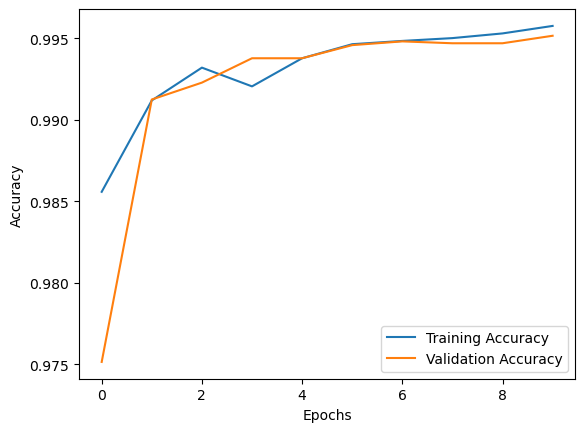

In [28]:
# Plot training and validation accuracy
plt.plot(history_finetune.history['accuracy'], label='Training Accuracy')
plt.plot(history_finetune.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

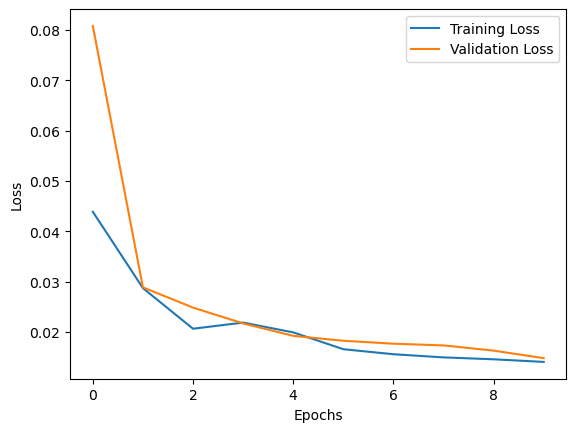

In [29]:
# Plot training and validation loss
plt.plot(history_finetune.history['loss'], label='Training Loss')
plt.plot(history_finetune.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

## Saving the Fine-tuned Model

In [30]:
# Save the Fine-tuned Model
model.save('fine_tuned_model.h5')

# Load the saved model
loaded_model = load_model('fine_tuned_model.h5')

C:\Users\Mr. Nartey\anaconda3\Lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


## Prediction Using the Saved Model

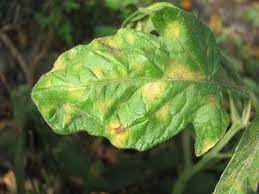

In [28]:

import numpy as np
import matplotlib.pyplot as plt
from keras.preprocessing import image as keras_image
from tensorflow.keras.preprocessing import image as keras_image

1/1 [==============================] - 9s 9s/step


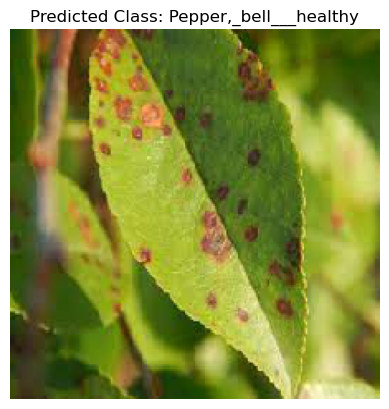

In [34]:
# Use the loaded model for making predictions on new images
new_image_path = 'cherry_leaf.JPG'
new_image = keras_image.load_img(new_image_path, target_size=(224, 224))
new_image_array = keras_image.img_to_array(new_image)
new_image_array = np.expand_dims(new_image_array, axis=0)
new_image_array = new_image_array / 255.0  # Normalize the image

# Get the predicted class probabilities
predicted_probabilities = loaded_model.predict(new_image_array)[0]
predicted_class_index = np.argmax(predicted_probabilities)

# Define the class_labels_dict with class labels and corresponding indices
class_labels_dict = {
    0: 'Apple___Apple_scab',
    1: 'Apple___Black_rot',
    2: 'Apple___Cedar_apple_rust',
    3: 'Apple___healthy',
    4: 'Blueberry___healthy',
    5: 'Cherry_(including_sour)___Powdery_mildew',
    6: 'Cherry_(including_sour)___healthy',
    7: 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot',
    8: 'Corn_(maize)___Common_rust_',
    9: 'Corn_(maize)___Northern_Leaf_Blight',
    10: 'Corn_(maize)___healthy',
    11: 'Grape___Black_rot',
    12: 'Grape___Esca_(Black_Measles)',
    13: 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)',
    14: 'Grape___healthy',
    15: 'Orange___Haunglongbing_(Citrus_greening)',
    16: 'Peach___Bacterial_spot',
    17: 'Peach___healthy',
    18: 'Pepper,_bell___Bacterial_spot',
    19: 'Pepper,_bell___healthy',
    20: 'Potato___Early_blight',
    21: 'Potato___Late_blight',
    22: 'Potato___healthy',
    23: 'Raspberry___healthy',
    24: 'Soybean___healthy',
    25: 'Squash___Powdery_mildew',
    26: 'Strawberry___Leaf_scorch',
    27: 'Strawberry___healthy',
    28: 'Tomato___Bacterial_spot',
    29: 'Tomato___Early_blight',
    30: 'Tomato___Late_blight',
    31: 'Tomato___Leaf_Mold',
    32: 'Tomato___Septoria_leaf_spot',
    33: 'Tomato___Spider_mites Two-spotted_spider_mite',
    34: 'Tomato___Target_Spot',
    35: 'Tomato___Tomato_Yellow_Leaf_Curl_Virus',
    36: 'Tomato___Tomato_mosaic_virus',
    37: 'Tomato___healthy'
}

# Check if the predicted_class_index is present in the dictionary
if predicted_class_index in class_labels_dict:
    predicted_class_label = class_labels_dict[predicted_class_index]
else:
    predicted_class_label = 'Unknown Class'

# Display the image and prediction
plt.imshow(new_image)
plt.title(f"Predicted Class: {predicted_class_label}")
plt.axis('off')
plt.show()


## Thank you
- If you liked it, please upvote.
- Made by: Abdelrahman Eldaba